<a href="https://colab.research.google.com/github/ibader85/UnstructuredDataAnalytics/blob/main/10_Introduction_to_Geospatial_Analysis_Updated.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

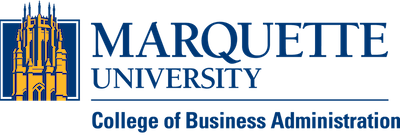

#BUAN4060: Unstructured Data Analytics

##10 Introduction to Geospatial Analysis (Updated)

##Instructor: Dr. Badar Al Lawati "Dr. B"

**Acknowledgment:** This material is based on the content created by `Prof. Timothy E. Carone`

**R on Colab:**

* You can change the runtime from Python to R, by clicking on the down arrow next to Connect, and picking "Change Runtime Type"

* You can change the project name by clicking on the title on top of this page

* You can export your notebook by going to File > Download .ipynb



## Prep the Workspace

In [ ]:
install.packages("dplyr")
install.packages("data.table")
install.packages("ggplot2")
install.packages("ggthemes")

library("dplyr")
library("data.table")
library("ggplot2")
library("ggthemes")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union



Attaching package: ‘data.table’


The following objects are masked from ‘package:dplyr’:

    between, first, last




##1. Mapping St. Louis County

In this example, we show how to work with shapefile data within R. We obtain a shapefile of municipal boundaries from http://data.stlouisco.com/. (In particular, we are using the file from this page: http://data.stlouisco.com/datasets/2273a9e78bae4b94a2a1e6bf67e375e1_6.)

In [ ]:
# Install and load sf package
install.packages("sf")

library("sf") # Load the modern spatial analysis package

### NOTE: ###
## Shapefile path is sensitive to trailing slash - needed on Mac, not on PC

myShapefilePath<- "/content/Municipal_Boundaries"
# myShapefilePath<- "....replace with path to shapefile folder..."

setwd(myShapefilePath)
dir() # should see MunicipalBoundaries (5 files)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependencies ‘proxy’, ‘e1071’, ‘wk’, ‘classInt’, ‘s2’, ‘units’


Linking to GEOS 3.11.1, GDAL 3.6.4, PROJ 9.1.1; sf_use_s2() is TRUE



[1] "Municipal_Boundaries.cpg" "Municipal_Boundaries.dbf"
[3] "Municipal_Boundaries.prj" "Municipal_Boundaries.shp"
[5] "Municipal_Boundaries.shx"

In [ ]:
# Read the shapefile using st_read()
stlco <- st_read(dsn = myShapefilePath, layer = "Municipal_Boundaries")

Reading layer `Municipal_Boundaries' from data source 
  `/content/Municipal_Boundaries' using driver `ESRI Shapefile'
Simple feature collection with 129 features and 6 fields
Geometry type: MULTIPOLYGON
Dimension:     XY
Bounding box:  xmin: 752590.9 ymin: 930073.6 xmax: 929153.3 ymax: 1113612
Projected CRS: NAD_1983_StatePlane_Missouri_East_FIPS_2401_Feet


In [ ]:
### dsn is directory where data is stored
### layer specifies the file name
### no need for file extension like .shp

###1.1 Examining what types of data are in the shapefile

The traditional “shape of your data” commands give some inkling to what things look like. One difference from working with simple data frames is the use of the “@” sign to access different slots in the SpatialPolygonsDataFrame. The “@data” slot stores a data frame associated with attribute data

In [ ]:
# Display summary information
summary(stlco)

    OBJECTID    MUNICIPALI            MUNI             MUNICODE        
 Min.   :  1   Length:129         Length:129         Length:129        
 1st Qu.: 33   Class :character   Class :character   Class :character  
 Median : 65   Mode  :character   Mode  :character   Mode  :character  
 Mean   : 65                                                           
 3rd Qu.: 97                                                           
 Max.   :129                                                           
                                                                       
    SQ_MILES          last_edite                  geometry  
 Min.   : 0.00026   Min.   :2020-11-09   MULTIPOLYGON :129  
 1st Qu.: 0.12484   1st Qu.:2020-11-09   epsg:NA      :  0  
 Median : 0.77326   Median :2020-11-09   +proj=tmer...:  0  
 Mean   : 4.42227   Mean   :2021-03-06                      
 3rd Qu.: 4.29005   3rd Qu.:2021-02-02                      
 Max.   :93.11465   Max.   :2023-02-01                    

In [ ]:
# Dimensions of the spatial data
dim(stlco)

[1] 129   7

In [ ]:
# Summary of the attribute data
summary(stlco)

    OBJECTID    MUNICIPALI            MUNI             MUNICODE        
 Min.   :  1   Length:129         Length:129         Length:129        
 1st Qu.: 33   Class :character   Class :character   Class :character  
 Median : 65   Mode  :character   Mode  :character   Mode  :character  
 Mean   : 65                                                           
 3rd Qu.: 97                                                           
 Max.   :129                                                           
                                                                       
    SQ_MILES          last_edite                  geometry  
 Min.   : 0.00026   Min.   :2020-11-09   MULTIPOLYGON :129  
 1st Qu.: 0.12484   1st Qu.:2020-11-09   epsg:NA      :  0  
 Median : 0.77326   Median :2020-11-09   +proj=tmer...:  0  
 Mean   : 4.42227   Mean   :2021-03-06                      
 3rd Qu.: 4.29005   3rd Qu.:2021-02-02                      
 Max.   :93.11465   Max.   :2023-02-01                    

In [ ]:
# Access specific column (equivalent to stlco@data$MUNI)
stlco$MUNI

[1] "UNI" "UNI" "NTH" "UNI" "GEP" "UNI" "GWV" "UNI" "UNI" "UNI" "BLV" "UNI"
 [13] "PAP" "UNI" "BRV" "VEL" "UNI" "UNI" "UNI" "BEV" "UNI" "CLA" "CLP" "UNI"
 [25] "DEL" "UNI" "BRH" "MOL" "NWC" "UNI" "UNI" "BLR" "OLV" "UNI" "STJ" "UNI"
 [37] "TWO" "HLD" "RIV" "VEH" "UPL" "BKJ" "GRN" "BLN" "PIN" "WEL" "OAK" "FEN"
 [49] "PGD" "CCH" "CHA" "SYC" "COV" "FLH" "UNI" "PAH" "NOR" "VIP" "HLH" "BFN"
 [61] "JEN" "UNI" "UNI" "KRW" "DES" "UNI" "GLN" "TAC" "UNI" "OVR" "ELV" "UNI"
 [73] "UNI" "CCR" "WES" "UNI" "UNI" "UNI" "UNI" "KIN" "FER" "CAL" "EDM" "WOD"
 [85] "BRK" "HAZ" "FLO" "STA" "UNI" "SHR" "FRT" "UNI" "HUN" "LAD" "WAR" "MPL"
 [97] "BRW" "RKH" "RMH" "CLY" "UCT" "MRH" "CMP" "BRG" "UNI" "CLK" "MRB" "WEB"
[109] "LAK" "EUR" "PAC" "UNI" "SUN" "CRE" "PAC" "UNI" "PAC" "WIL" "GPK" "VAL"
[121] "WWD" "UNI" "UNI" "WIN" "BAL" "MAN" "CHF" "UNI" NA

In [ ]:
# Coordinates of the first feature (using st_geometry() and st_coordinates())
head(st_coordinates(st_geometry(stlco)[[1]]))

X,Y,L1,L2,L3
878523.2,1051090,1,1,1
878524.4,1051088,1,1,1
878531.8,1051075,1,1,1
878656.5,1050864,1,1,1
878690.4,1050807,1,1,1
878689.9,1050807,1,1,1


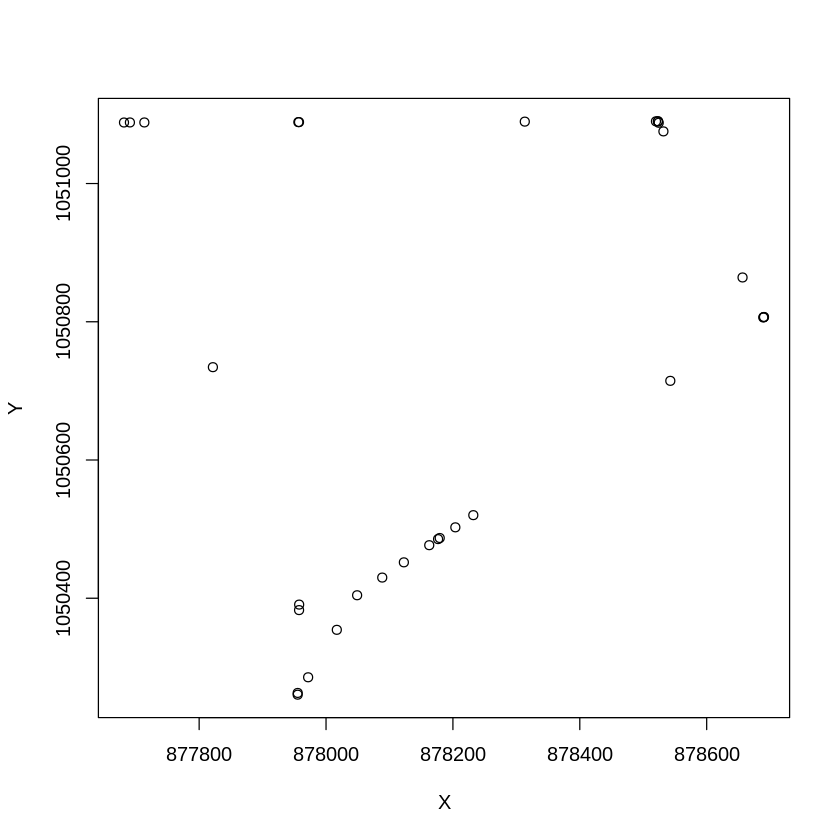

In [ ]:
# Plot the coordinates of the first feature
plot(st_coordinates(st_geometry(stlco)[[1]]))

In [ ]:
# View the first 10 rows of attribute data
head(stlco, n = 10)

ERROR while rich displaying an object: Error in loadNamespace(x): there is no package called ‘geojsonio’

Traceback:
1. sapply(x, f, simplify = simplify)
2. lapply(X = X, FUN = FUN, ...)
3. FUN(X[[i]], ...)
4. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
5. tryCatchList(expr, classes, parentenv, handlers)
6. tryCatchOne(expr, names, parentenv, handlers[[1L]])
7. doTryCatch(return(expr), name, parentenv, handler)
8. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = 

,OBJECTID,MUNICIPALI,MUNI,MUNICODE,SQ_MILES,last_edite,geometry
,<int>,<chr>,<chr>,<chr>,<dbl>,<date>,<MULTIPOLYGON [US_survey_foot]>
1,1,UNINCORPORATED,UNI,000,0.01620425,2020-11-09,MULTIPOLYGON (((878523.2 10...
2,2,UNINCORPORATED,UNI,000,0.00104069,2020-11-09,MULTIPOLYGON (((881801.6 10...
3,3,NORTHWOODS,NTH,040,0.67333775,2020-11-09,MULTIPOLYGON (((882597.8 10...
4,4,UNINCORPORATED,UNI,000,0.02893888,2020-11-09,MULTIPOLYGON (((882561.7 10...
5,5,GLEN ECHO PARK,GEP,027,0.03122508,2020-11-09,MULTIPOLYGON (((877920 1044...
6,6,UNINCORPORATED,UNI,000,0.00173643,2020-11-09,MULTIPOLYGON (((790820.7 10...
7,7,GRANTWOOD VILLAGE,GWV,029,0.80898748,2020-11-09,MULTIPOLYGON (((862675.7 99...
8,8,UNINCORPORATED,UNI,000,0.00135399,2020-11-09,MULTIPOLYGON (((876561.6 10...
9,9,UNINCORPORATED,UNI,000,0.00400754,2020-11-09,MULTIPOLYGON (((853856.2 10...


In [ ]:
# Calculate the mean of the SQ_MILES column
mean(stlco$SQ_MILES) ### compute the average area

[1] NA

In [ ]:
# Names of the columns in the attribute data
names(stlco)

[1] "OBJECTID"   "MUNICIPALI" "MUNI"       "MUNICODE"   "SQ_MILES"  
[6] "last_edite" "geometry"

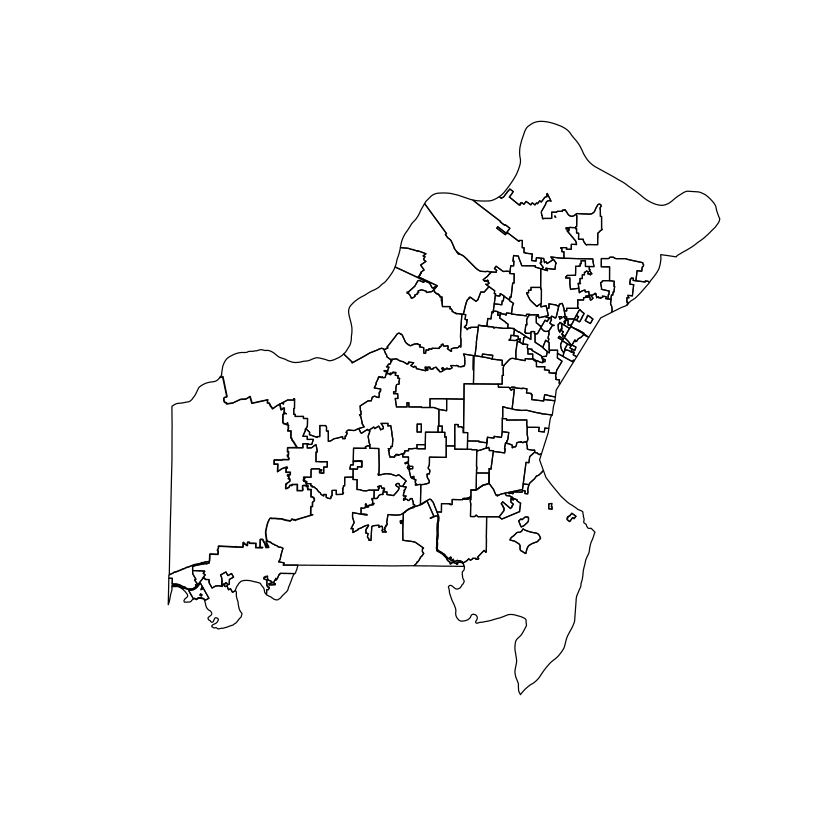

In [ ]:
# Plot the entire shapefile
plot(st_geometry(stlco)) ### plots the map of St. Louis County Municipal boundaries

In [ ]:
# Check projection information (CRS)
st_crs(stlco)

Coordinate Reference System:
  User input: NAD_1983_StatePlane_Missouri_East_FIPS_2401_Feet 
  wkt:
PROJCRS["NAD_1983_StatePlane_Missouri_East_FIPS_2401_Feet",
    BASEGEOGCRS["NAD83",
        DATUM["North American Datum 1983",
            ELLIPSOID["GRS 1980",6378137,298.257222101,
                LENGTHUNIT["metre",1]]],
        PRIMEM["Greenwich",0,
            ANGLEUNIT["degree",0.0174532925199433]],
        ID["EPSG",4269]],
    CONVERSION["NAD_1983_StatePlane_Missouri_East_FIPS_2401_Feet",
        METHOD["Transverse Mercator",
            ID["EPSG",9807]],
        PARAMETER["Latitude of natural origin",35.8333333333333,
            ANGLEUNIT["degree",0.0174532925199433],
            ID["EPSG",8801]],
        PARAMETER["Longitude of natural origin",-90.5,
            ANGLEUNIT["degree",0.0174532925199433],
            ID["EPSG",8802]],
        PARAMETER["Scale factor at natural origin",0.999933333333333,
            SCALEUNIT["unity",1],
            ID["EPSG",8805]],
        PARAM

In [ ]:
# If you want to store the CRS for later operations
stlcoCRS <- st_crs(stlco)

### 1.2 A little exploratory data analysis

In [ ]:
# Named Municipalities
# Filter for municipalities that are not "UNI"
named_municipalities <- stlco %>%
  filter(MUNI != "UNI")

In [ ]:
# Mean area (SQ_MILES) for named municipalities
mean(named_municipalities$SQ_MILES)

[1] NA

In [ ]:
# Summary of area (SQ_MILES) for named municipalities
summary(named_municipalities$SQ_MILES)

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max.     NA's 
 0.03123  0.34104  0.98690  4.04007  4.35441 67.20598        1 

In [ ]:
# Municipalities with SQ_MILES >= 50
named_large_municipalities <- named_municipalities %>%
  filter(SQ_MILES >= 50)

In [ ]:
# Mean area for named municipalities with SQ_MILES < 50
mean(named_municipalities %>% filter(SQ_MILES < 50) %>% pull(SQ_MILES))

[1] 3.322281

In [ ]:
# Unincorporated municipalities
unincorporated_municipalities <- stlco %>%
  filter(MUNI == "UNI")

In [ ]:
# Mean area for unincorporated municipalities
mean(unincorporated_municipalities$SQ_MILES)

[1] 5.317425

In [ ]:
# Summary of area for unincorporated municipalities
summary(unincorporated_municipalities$SQ_MILES)

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
 0.00026  0.00293  0.02662  5.31743  2.02155 93.11465 

In [ ]:
# Unincorporated municipalities with SQ_MILES >= 50
large_unincorporated_municipalities <- unincorporated_municipalities %>%
  filter(SQ_MILES >= 50)

  head(large_unincorporated_municipalities)

ERROR while rich displaying an object: Error in loadNamespace(x): there is no package called ‘geojsonio’

Traceback:
1. sapply(x, f, simplify = simplify)
2. lapply(X = X, FUN = FUN, ...)
3. FUN(X[[i]], ...)
4. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
5. tryCatchList(expr, classes, parentenv, handlers)
6. tryCatchOne(expr, names, parentenv, handlers[[1L]])
7. doTryCatch(return(expr), name, parentenv, handler)
8. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = 

,OBJECTID,MUNICIPALI,MUNI,MUNICODE,SQ_MILES,last_edite,geometry
,<int>,<chr>,<chr>,<chr>,<dbl>,<date>,<MULTIPOLYGON [US_survey_foot]>
1,66,UNINCORPORATED,UNI,000,55.29098,2020-11-09,MULTIPOLYGON (((901029.4 10...
2,122,UNINCORPORATED,UNI,000,93.11465,2023-01-10,MULTIPOLYGON (((822932.9 10...


In [ ]:
# Summary of area for unincorporated municipalities with SQ_MILES < 50
summary(unincorporated_municipalities %>% filter(SQ_MILES < 50) %>% pull(SQ_MILES))

    Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
0.000263 0.002509 0.022875 1.490460 1.107097 7.668381 

In [ ]:
# Explore a specific municipality
# List unique municipalities
unique(stlco$MUNICIPALI)

[1] "UNINCORPORATED"          "NORTHWOODS"             
 [3] "GLEN ECHO PARK"          "GRANTWOOD VILLAGE"      
 [5] "BELLA VILLA"             "PASADENA PARK"          
 [7] "BELLERIVE ACRES"         "VELDA CITY"             
 [9] "BEVERLY HILLS"           "COUNTRY LIFE ACRES"     
[11] "CRYSTAL LAKE PARK"       "DELLWOOD"               
[13] "BRECKENRIDGE HILLS"      "MOLINE ACRES"           
[15] "NORWOOD COURT"           "BEL-RIDGE"              
[17] "OLIVETTE"                "ST JOHN"                
[19] "TWIN OAKS"               "HILLSDALE"              
[21] "RIVERVIEW"               "VELDA VILLAGE HILLS"    
[23] "UPLANDS PARK"            "BLACK JACK"             
[25] "GREENDALE"               "BEL-NOR"                
[27] "PINE LAWN"               "WELLSTON"               
[29] "OAKLAND"                 "FENTON"                 
[31] "PAGEDALE"                "COUNTRY CLUB HILLS"     
[33] "CHARLACK"                "SYCAMORE HILLS"         
[35] "COOL VALLEY"             "FLORDELL HILLS"         
[37] "PASADENA HILLS"          "NORMANDY"               
[39] "VINITA PARK"             "HANLEY HILLS"           
[41] "BELLEFONTAINE NEIGHBORS" "JENNINGS"               
[43] "KIRKWOOD"                "DES PERES"              
[45] "GLENDALE"                "TOWN & COUNTRY"         
[47] "OVERLAND"                "ELLISVILLE"             
[49] "CREVE COEUR"             "WESTWOOD"               
[51] "KINLOCH"                 "FERGUSON"               
[53] "CALVERTON PARK"          "EDMUNDSON"              
[55] "WOODSON TERRACE"         "BERKELEY"               
[57] "HAZELWOOD"               "FLORISSANT"             
[59] "ST ANN"                  "SHREWSBURY"             
[61] "FRONTENAC"               "HUNTLEIGH"              
[63] "LADUE"                   "WARSON WOODS"           
[65] "MAPLEWOOD"               "BRENTWOOD"              
[67] "ROCK HILL"               "RICHMOND HEIGHTS"       
[69] "CLAYTON"                 "UNIVERSITY CITY"        
[71] "MARYLAND HEIGHTS"        "CHAMP"                  
[73] "BRIDGETON"               "CLARKSON VALLEY"        
[75] "MARLBOROUGH"             "WEBSTER GROVES"         
[77] "LAKESHIRE"               "EUREKA"                 
[79] "PACIFIC"                 "SUNSET HILLS"           
[81] "CRESTWOOD"               "WILBUR PARK"            
[83] "GREEN PARK"              "VALLEY PARK"            
[85] "WILDWOOD"                "WINCHESTER"             
[87] "BALLWIN"                 "MANCHESTER"             
[89] "CHESTERFIELD"            NA

In [ ]:
# Filter for a specific municipality, e.g., "FERGUSON"
ferguson <- stlco %>%
  filter(MUNICIPALI == "FERGUSON")

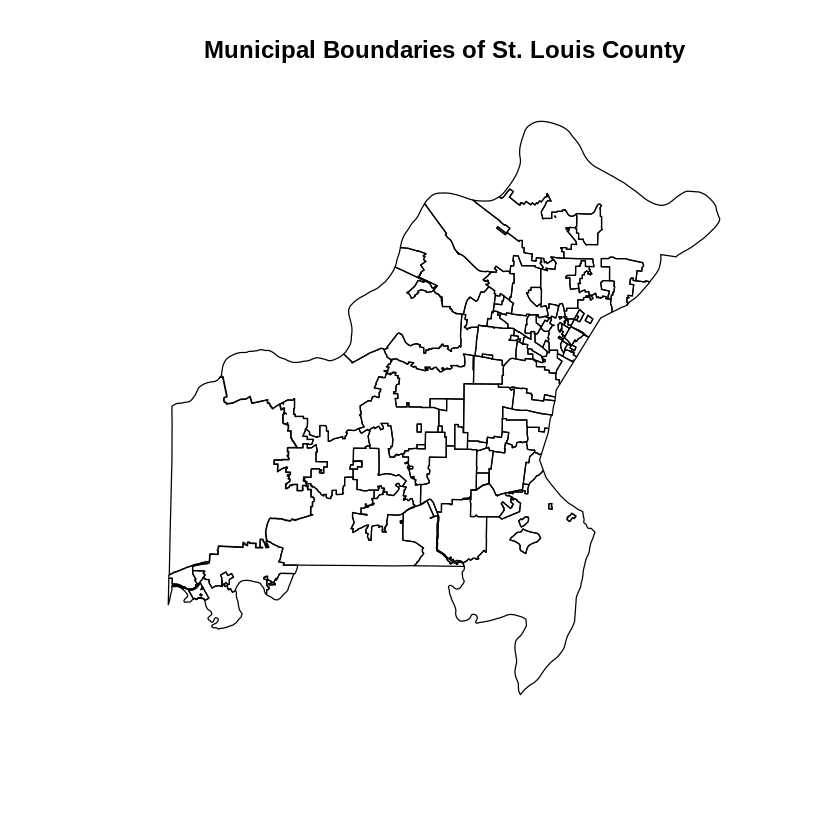

In [ ]:
# Base plot of the entire dataset
plot(st_geometry(stlco), main = "Municipal Boundaries of St. Louis County")

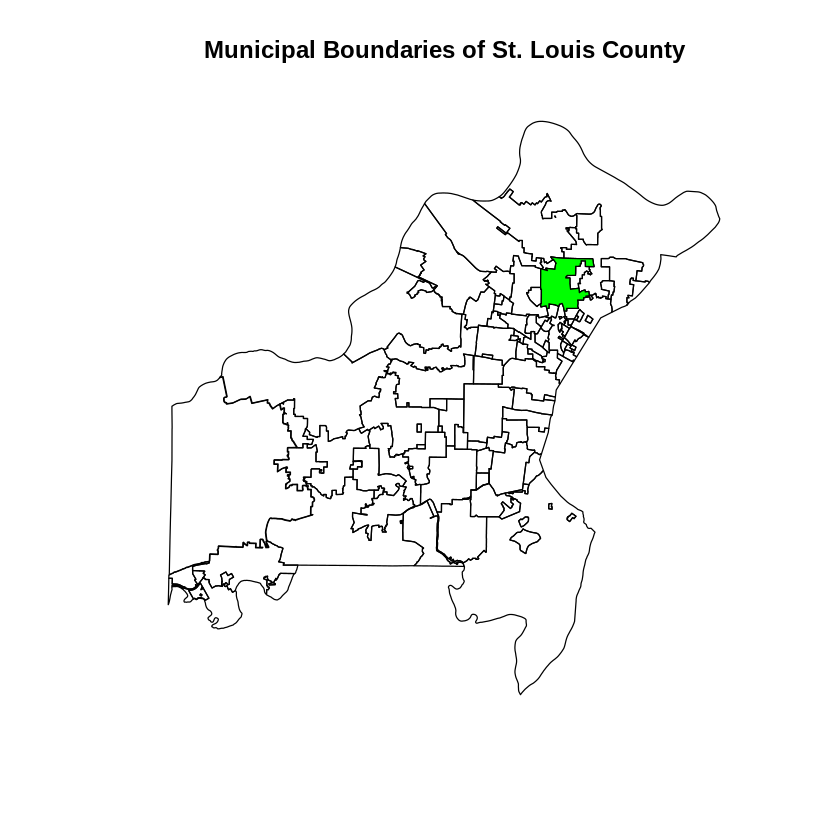

In [ ]:
# Base plot of the entire dataset
plot(st_geometry(stlco), main = "Municipal Boundaries of St. Louis County")

# Overlay the specific municipality (FERGUSON) in green
plot(st_geometry(ferguson), col = "green", add = TRUE)

### 1.3 Compute centroid of municipality
The centroid or center of mass is one way to represent the “middle” of a given polygon

In [ ]:


# Calculate and display the centroid of Ferguson
ferg_cent <- st_centroid(stlco %>% filter(MUNICIPALI == "FERGUSON"))
print(ferg_cent)  # Display as plain text output

Warning message:
“st_centroid assumes attributes are constant over geometries”


Simple feature collection with 1 feature and 6 fields
Geometry type: POINT
Dimension:     XY
Bounding box:  xmin: 878670.8 ymin: 1061600 xmax: 878670.8 ymax: 1061600
Projected CRS: NAD_1983_StatePlane_Missouri_East_FIPS_2401_Feet
  OBJECTID MUNICIPALI MUNI MUNICODE SQ_MILES last_edite
1       81   FERGUSON  FER      022 6.159777 2020-11-09
                  geometry
1 POINT (878670.8 1061600)


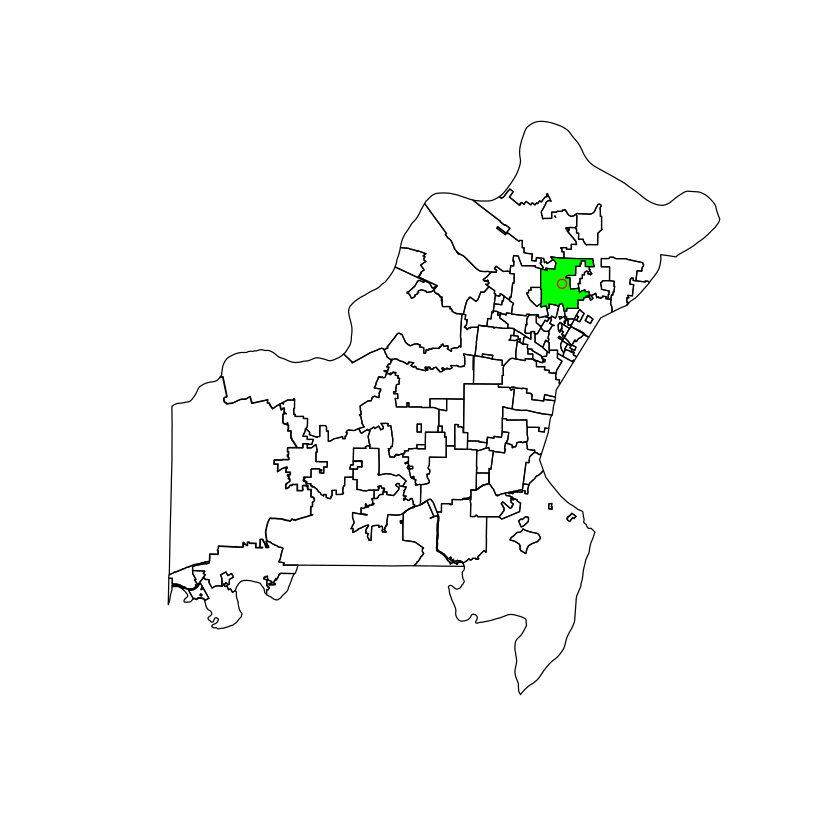

In [ ]:
# Plot the entire shapefile
plot(st_geometry(stlco))

# Plot the Ferguson municipality in green, overlayed
plot(st_geometry(stlco %>% filter(MUNICIPALI == "FERGUSON")), col = "green", add = TRUE)

# Plot the centroid of Ferguson in red, overlayed
plot(st_geometry(ferg_cent), col = "red", add = TRUE)

### 1.4 Compute a buffer
A buffer is a region that extends a spatial object outward by a given distance. A buffer around a point is a circle centered at that point

A buffer of a street centerline is a strip of land that could include the shoulder, the median, and sidewalk running parallel to the road

A buffer of a state could include all regions within 10 miles of that state’s border

We note here that the data from St. Louis County was delivered in geographic coordinates, not projected coordinates

This means that we have latitude and longitude data that is inherently 3D. We will need to project this in order to compute a buffer

We will first try to only project the centroid, compute the buffer relative to it, and continue from there

In [ ]:
# Set the target projection using EPSG code or PROJ string (example projection provided)
target_crs <- "+proj=tmerc +lat_0=35.83333333333334 +lon_0=-90.5 +k=0.999933333 +x_0=250000 +y_0=0 +ellps=GRS80 +units=m +no_defs"

# Transform the Ferguson centroid to the target CRS
ferg_cent_transformed <- st_transform(ferg_cent, crs = target_crs)

# Create a 3-mile buffer (approx. 4828 meters) around the transformed centroid
ferg_buffer <- st_buffer(ferg_cent_transformed, dist = 4828)

# Check it
ferg_buffer

ERROR while rich displaying an object: Error in loadNamespace(x): there is no package called ‘geojsonio’

Traceback:
1. sapply(x, f, simplify = simplify)
2. lapply(X = X, FUN = FUN, ...)
3. FUN(X[[i]], ...)
4. tryCatch(withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = error_handler), error = outer_handler)
5. tryCatchList(expr, classes, parentenv, handlers)
6. tryCatchOne(expr, names, parentenv, handlers[[1L]])
7. doTryCatch(return(expr), name, parentenv, handler)
8. withCallingHandlers({
 .     if (!mime %in% names(repr::mime2repr)) 
 .         stop("No repr_* for mimetype ", mime, " in repr::mime2repr")
 .     rpr <- repr::mime2repr[[mime]](obj)
 .     if (is.null(rpr)) 
 .         return(NULL)
 .     prepare_content(is.raw(rpr), rpr)
 . }, error = 

,OBJECTID,MUNICIPALI,MUNI,MUNICODE,SQ_MILES,last_edite,geometry
,<int>,<chr>,<chr>,<chr>,<dbl>,<date>,<POLYGON [m]>
1,81,FERGUSON,FER,022,6.159777,2020-11-09,POLYGON ((272647.4 323576.3...


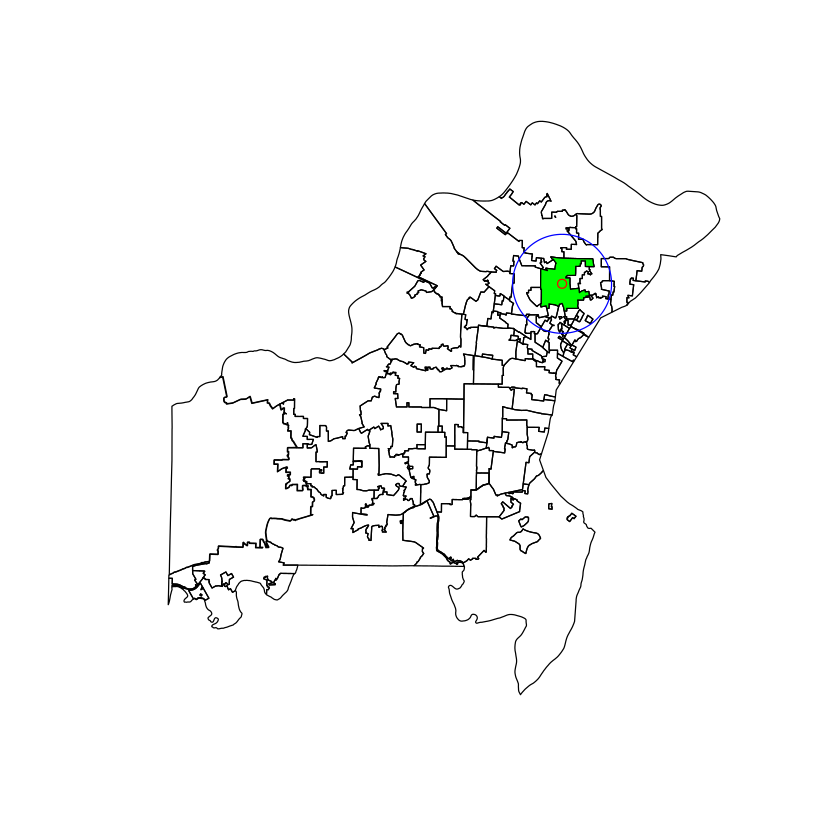

In [ ]:
# Transform the buffer back to the original CRS of stlco for plotting
ferg_buffer_geog_coords <- st_transform(ferg_buffer, crs = st_crs(stlco))

# Plot the entire shapefile
plot(st_geometry(stlco))

# Plot Ferguson municipality in green, overlayed
plot(st_geometry(stlco %>% filter(MUNICIPALI == "FERGUSON")), col = "green", add = TRUE)

# Plot the centroid in red
plot(st_geometry(ferg_cent), col = "red", add = TRUE)

# Plot the buffer around Ferguson in blue
plot(st_geometry(ferg_buffer_geog_coords), add = TRUE, border = "blue")

**1.4.1 Subsetting by a buffer**

Computing a buffer allows you to easily subset the spatial objects within that buffer
(But you need the CRS to be the same)

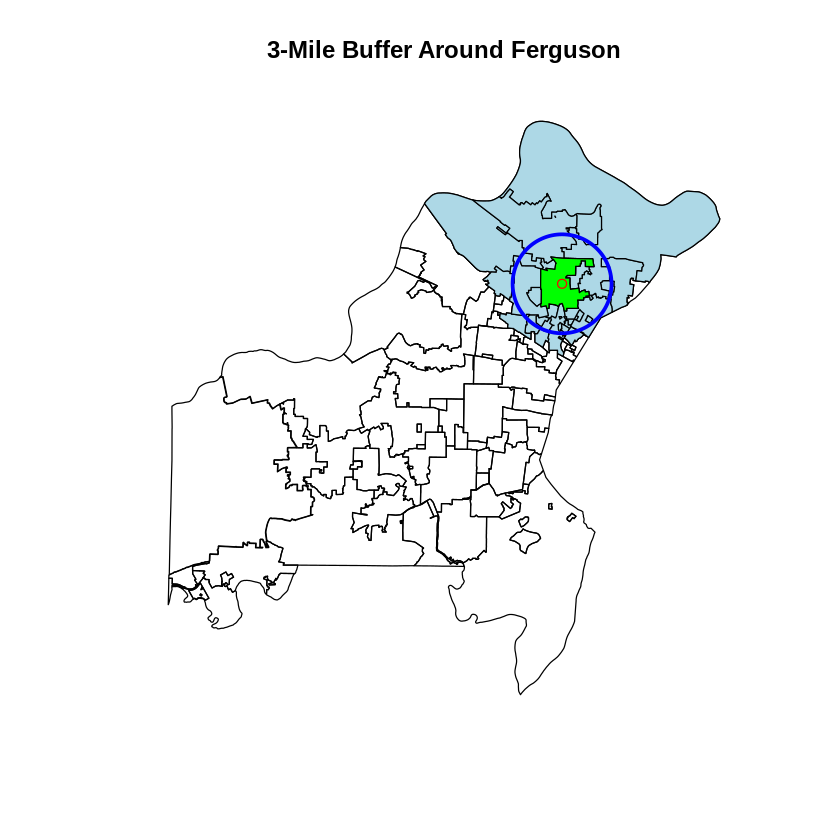

In [ ]:
# Identify areas within the 3-mile buffer around Ferguson
ferg_3mi <- stlco[ferg_buffer_geog_coords, ]

# Plot the 3-mile buffer and the selected areas within it
plot(st_geometry(stlco), main = "3-Mile Buffer Around Ferguson")
plot(st_geometry(ferg_3mi), col = "lightblue", add = TRUE)
plot(st_geometry(ferg_buffer_geog_coords), add = TRUE, border = "blue", lwd = 3)
plot(st_geometry(stlco %>% filter(MUNICIPALI == "FERGUSON")), col = "green", add = TRUE)
plot(st_geometry(ferg_cent), col = "red", add = TRUE)

### 1.5 Add in basemap with Leaflet
Once the St. Louis County Data is converted to geographic coordinates (lat/lon pairs), we can easily display it with Leaflet

Without the transformation, we just see a plot of the whole earth

In [ ]:
# Install and load the leaflet package if not already installed
install.packages("leaflet")
install.packages("sf")
install.packages("terra")

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [ ]:
library(sf)
library(leaflet)
library(leaflet)

# Transform `stlco` to WGS84
stlco_latlon <- st_transform(stlco, crs = 4326)  # EPSG code for WGS84

In [ ]:
install.packages("htmlwidgets")
library(htmlwidgets)

# Simplify the geometry for easier rendering (only for testing)
stlco_latlon_simple <- st_simplify(stlco_latlon, dTolerance = 0.01)

# Create the leaflet map object
map <- leaflet() %>%
  addTiles() %>%
  addPolygons(data = stlco_latlon, fillColor = "green")

# Print the map object to display in Colab
print(map)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [ ]:
# Initial leaflet map with `stlco`
leaflet() %>%
  addTiles() %>%
  addPolygons(data = stlco)

# Transform `stlco` to WGS84 CRS for use in leaflet
stlco_latlon <- st_transform(stlco, crs = 4326)  # EPSG code for WGS84

Warning message:
“sf layer is not long-lat data”
Warning message:
“sf layer has inconsistent datum (+proj=tmerc +lat_0=35.8333333333333 +lon_0=-90.5 +k=0.999933333333333 +x_0=250000 +y_0=0 +datum=NAD83 +units=us-ft +no_defs).
Need '+proj=longlat +datum=WGS84'”


HTML widgets cannot be represented in plain text (need html)

In [ ]:
# where did our data go?
# Display the transformed data on the leaflet map
leaflet() %>%
  addTiles() %>%
  addPolygons(data = stlco_latlon)

HTML widgets cannot be represented in plain text (need html)

In [ ]:
# Add styling to the polygons on the map
leaflet() %>%
  addTiles() %>%
  addPolygons(data = stlco_latlon, fillColor = "green",
              highlightOptions = highlightOptions(color = "white", weight = 2,
                                                  bringToFront = TRUE))

HTML widgets cannot be represented in plain text (need html)

In [ ]:
# Transform `ferg_3mi` to WGS84 CRS
ferg3mi_latlon <- st_transform(ferg_3mi, crs = 4326)

# Display both `stlco_latlon` and `ferg3mi_latlon` with customized styling
leaflet() %>%
  addTiles() %>%
  addPolygons(data = stlco_latlon, fillColor = "green",
              highlightOptions = highlightOptions(color = "white", weight = 2,
                                                  bringToFront = TRUE),
              label = ~MUNICIPALI) %>%
  addPolygons(data = ferg3mi_latlon, fillColor = "blue",
              highlightOptions = highlightOptions(color = "white", weight = 2,
                                                  bringToFront = TRUE),
              label = ~MUNICIPALI)

HTML widgets cannot be represented in plain text (need html)